In [1]:
# pip install --upgrade pystac-client

In [2]:
# %pip install pystac_client==0.4

In [3]:
# pip show pystac_client
# %pip install terracatalogueclient

In [4]:
# imports
import pystac_client
import xarray as xr
import matplotlib.pyplot as plt
import pathlib
import os
import numpy as np
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio

import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
from rasterio.plot import show

import matplotlib.colors as mcolors
from shapely.geometry import Point
import pandas as pd

from tqdm import tqdm

import webbrowser
from pathlib import Path
import os
import time


In [5]:
# opening STAC catalog, either a url, cloud storage link or a local (cloned) folder
cwd = pathlib.Path().resolve()

catalog = pystac_client.Client.open(
    "https://storage.googleapis.com/dgds-data-public/gca/SOTC/gca-stac_sotc/catalog.json" # cloud API
    #os.path.join(os.path.dirname(cwd), "stac_folder", "current", "catalog.json") # local clone 
)
catalog

<Client id=gca-catalog>

In [6]:
list(catalog.get_children())

[<CollectionClient id=shore_mon_fut>,
 <CollectionClient id=sed_class>,
 <CollectionClient id=shore_mon>,
 <CollectionClient id=world_pop>,
 <CollectionClient id=world_gdp>,
 <CollectionClient id=shore_mon_hr>,
 <CollectionClient id=shore_mon_drivers>,
 <CollectionClient id=esl_gwl>,
 <CollectionClient id=sub_threat>,
 <CollectionClient id=Exp_world_pop>,
 <CollectionClient id=Exp_world_pop_parquet>,
 <CollectionClient id=Haz-ESL>,
 <CollectionClient id=Vul-Inf_Mort>,
 <CollectionClient id=Haz-GCM_90-100>,
 <CollectionClient id=Exp-NS_Slopes>,
 <CollectionClient id=Vul_MYS>,
 <CollectionClient id=Vul_RS>,
 <CollectionClient id=Haz-GCM_40-50>,
 <CollectionClient id=Haz-ERA5_04-14>,
 <CollectionClient id=Vul-GDP_Cap>,
 <CollectionClient id=Haz-GCM_04-14>,
 <CollectionClient id=Haz-Land_Sub_2010_COGs>,
 <CollectionClient id=Haz-Land_Sub_2040_COGs>,
 <CollectionClient id=Vul-Roads_Density_COGs>,
 <CollectionClient id=Exp-Delta_DEM_COGs>]

In [7]:
collection= catalog.get_child("Exp-Delta_DEM_COGs")
collection

<CollectionClient id=Exp-Delta_DEM_COGs>

In [8]:
# b=list(catalog.get_collections())
# for collec in b:
#     print(f"{collec.id}")

In [9]:
# items=list(collection.get_all_items())
# print(f"Number of items: {len(items)}")
# for item in items:
#     print(f"- {item.id}")

In [10]:
# World cover goes up in increments of 3 degrees

import math
tile_size=1
tile_prefix="DeltaDTM_v1_0_"
decimal_zero="_00_"
tile_suffix="_00_DEM"

 


def find_tile_name(lat,lon,tile_size,tile_prefix):
    if lon>0:
        sign_lon="E"
    else:
        sign_lon="W"
    if lat>0:
        sign_lat="N"
    else:
        sign_lat="S"
    if abs(lat)<10:
        newlat="0"+str(abs(math.floor(lat/tile_size)*tile_size))
    else:
        newlat=str(abs(math.floor(lat/tile_size)*tile_size))

    if abs(lon)<10:
        newlon="00"+str(abs(math.floor(lon/tile_size)*tile_size))   
    elif abs(lon)<100:
        newlon="0"+str(abs(math.floor(lon/tile_size)*tile_size))
    else:
        newlon=str(abs(math.floor(lon/tile_size)*tile_size))


    tile_name=tile_prefix+ sign_lat+newlat+sign_lon+newlon
    return tile_name

# DeltaDTM_v1_0_S69W092
# urn:eop:VITO:COP_DEM_GLO_30M_COG:Copernicus_DSM_COG_10_N00_00_W075_00_DEM
#  eg item_id="ESA_WorldCover_10m_2020_v100_S57W072"


In [11]:
collection.get_item("DeltaDTM_v1_0_S69W091")

<Item id=DeltaDTM_v1_0_S69W091>

In [12]:
collection.get_item("DeltaDTM_v1_0_S69W092").assets["band_data"].href

'https://storage.googleapis.com/dgds-data-public/gca/SOTC/Exp-Delta_DEM_COGs/DeltaDTM_v1_0_S69W092.tif'

In [13]:


lon_x=-69.07256	
lat_y=12.18975	




tile_name = find_tile_name(lat_y, lon_x, tile_size, tile_prefix)
tile_name


href = collection.get_item(tile_name).assets["band_data"].href



DELTA_DEM_xr = xr.open_dataset(href, engine="rasterio", mask_and_scale=False)

DELTA_DEM_xr





<xarray.Dataset>
Dimensions:      (band: 1, x: 3600, y: 3600)
Coordinates:
  * band         (band) int32 1
  * x            (x) float64 -70.0 -70.0 -70.0 -70.0 ... -69.0 -69.0 -69.0 -69.0
  * y            (y) float64 13.0 13.0 13.0 13.0 13.0 ... 12.0 12.0 12.0 12.0
    spatial_ref  int32 ...
Data variables:
    band_data    (band, y, x) float32 ...

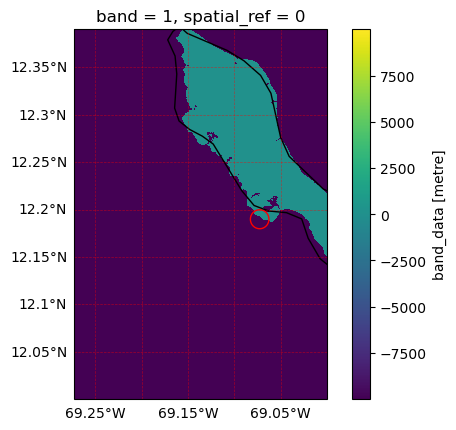

In [14]:
# Create a map projection
ax = plt.axes(projection=ccrs.PlateCarree())

# Plot the variable
DELTA_DEM_xr["band_data"].sel(x=slice(lon_x-.2,lon_x+.2),y=slice(lat_y+.2,lat_y-.2)).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='viridis')

# Add features like coastlines, borders, and ocean
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')
# ax.add_feature(cartopy.feature.OCEAN)

gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                  linewidth=0.5, color='red', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False


# Create a point geometry
point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])

# Add a  1000m buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)

# Plot the GeoDataFrame
# fig, ax = plt.subplots(subplot_kw={"projection": ccrs.PlateCarree()})
gdf.plot(ax=ax, color='none', edgecolor='red')
# Plot the variable


# Show the plot
plt.show()



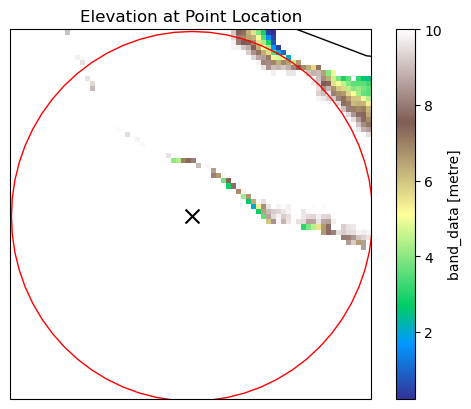

In [15]:

search_square=DELTA_DEM_xr["band_data"].sel(x=slice(lon_x-.01,lon_x+.01),y=slice(lat_y+.01,lat_y-.01))

search_square.values = np.where(search_square.values > 0, search_square.values, np.nan)




# Create a new Axes for the Colorbar
fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.coastlines()
ax.add_feature(cartopy.feature.BORDERS, linestyle=':', edgecolor='black')


search_square.plot(ax=ax, cmap='terrain')

point = Point(lon_x, lat_y)

# Create a GeoDataFrame from the point
gdf = gpd.GeoDataFrame(geometry=[point])
gdf2 = gpd.GeoDataFrame(geometry=[point])

# Add a 1000m = 0.01degrees buffer around the point
gdf['geometry'] = gdf['geometry'].buffer(.01)

# Define the projection
crs = "EPSG:4326"  # WGS84
gdf.set_crs(crs, inplace=True)
gdf2.set_crs(crs, inplace=True)

gdf2.plot(ax=ax, color='black', marker='x', markersize=100)  # Create a point geometry
gdf.plot(ax=ax, color='none', edgecolor='red')  # Create a point geometry
plt.title("Elevation at Point Location")
plt.show()



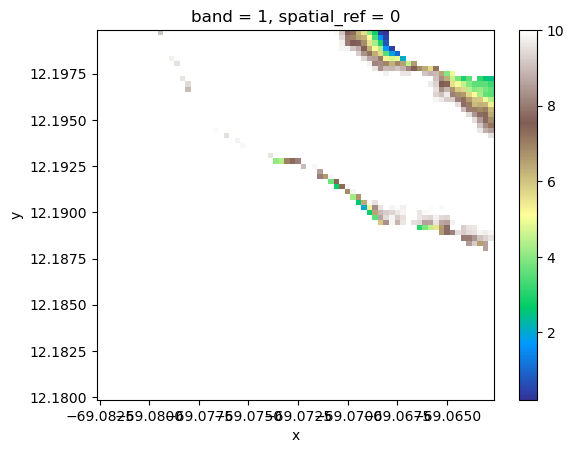

In [16]:
#Visualizing methodology
Lower_mask=0 
Upper_mask= 10
tile_size=1

search_radius=0.01 #Degress=1000m

tile_name = find_tile_name(lat_y, lon_x, tile_size, tile_prefix)


href = collection.get_item(tile_name).assets["band_data"].href



DELTA_DEM_xr = xr.open_dataset(href, engine="rasterio", mask_and_scale=False)

search_square=DELTA_DEM_xr["band_data"].sel(x=slice(lon_x-search_radius,lon_x+search_radius),y=slice(lat_y+search_radius,lat_y-search_radius))




LECZ_values = np.where((search_square.values >Lower_mask) & (search_square.values <= Upper_mask), search_square.values, np.nan)
LECZ_values_da = xr.DataArray(LECZ_values, coords=search_square.coords, dims=search_square.dims)



# Plot the modified data array
LECZ_values_da.plot(cmap='terrain')





In [17]:
# Calculating Pixel sizes
tile_name="DeltaDTM_v1_0_N00E119"
href = collection.get_item(tile_name).assets["band_data"].href



DELTA_DEM_xr = xr.open_dataset(href, engine="rasterio", mask_and_scale=False)


x_coords = DELTA_DEM_xr.coords['x']
y_coords = DELTA_DEM_xr.coords['y']

# Calculate the pixel size
x_pixel_size = x_coords[1].values - x_coords[0].values
y_pixel_size = y_coords[1].values - y_coords[0].values

pixel_area_deg=x_pixel_size*y_pixel_size


pixel_area_deg

-7.716049382841819e-08

In [18]:
import utm

def degrees_squared_to_m2(lat1, lon1,lat2, lon2):
    # Calculate UTM zone for the given latitude and longitude
    utm_zone = utm.from_latlon(lat1, lon1)[2]

    # Get UTM projection parameters
    utm_params1 = utm.from_latlon(lat1, lon1)
    utm_params2 = utm.from_latlon(lat2, lon2)

    dist_lat= abs(utm_params1[0]-utm_params2[0])
    dist_lon= abs(utm_params1[1]-utm_params2[1])

    pixel_area_m2=dist_lat*dist_lon

    return  pixel_area_m2

# Example usage:
ds=DELTA_DEM_xr
lat1=ds.coords['y'][0].values
lon1=ds.coords['x'][0].values
lat2=ds.coords['y'][1].values
lon2=ds.coords['x'][1].values


pixel_area_m2 = degrees_squared_to_m2(lat1, lon1,lat2, lon2)
print("Pixel Area in square meters:", pixel_area_m2)


Pixel Area in square meters: 950.0302031386741


In [19]:
def degrees_to_m(lat1, lon1,lat2, lon2):
    # Calculate UTM zone for the given latitude and longitude
    utm_zone = utm.from_latlon(lat1, lon1)[2]

    # Get UTM projection parameters
    utm_params1 = utm.from_latlon(lat1, lon1)
    utm_params2 = utm.from_latlon(lat2, lon2)

    dist_lat= abs(utm_params1[0]-utm_params2[0])
    dist_lon= abs(utm_params1[1]-utm_params2[1])

    pixel_dist_m=dist_lat

    return  pixel_dist_m

# Example usage:
ds=DELTA_DEM_xr
lat1=ds.coords['y'][0].values
lon1=ds.coords['x'][0].values
lat2=ds.coords['y'][1].values
lon2=ds.coords['x'][1].values


pixel_dist_m = degrees_to_m(lat1, lon1,lat2, lon2)
print("Pixel dist in meters:", pixel_dist_m)

dist_lat_deg=abs(lat1-lat2)
print("1000m equivalent in degrees:", (dist_lat_deg/pixel_dist_m)*1000)

Pixel dist in meters: 30.942715434357524
1000m equivalent in degrees: 0.008977162278052304


In [20]:
#Visualizing methodology
Lower_mask=0 
Upper_mask= 10
tile_size=1
search_radius=0.01 #Degrees=1000m
search_radius_m=1000 #Degrees=1000m


tile_name = find_tile_name(lat_y, lon_x, tile_size, tile_prefix)


href = collection.get_item(tile_name).assets["band_data"].href



DELTA_DEM_xr = xr.open_dataset(href, engine="rasterio", mask_and_scale=False)

ds=search_square
lat1=ds.coords['y'][0].values
lon1=ds.coords['x'][0].values
lat2=ds.coords['y'][1].values
lon2=ds.coords['x'][1].values


pixel_area_m2 = degrees_squared_to_m2(lat1, lon1,lat2, lon2)

dist_lat_deg=abs(lat1-lat2)
search_radius=(dist_lat_deg/pixel_dist_m)*search_radius_m

search_square=DELTA_DEM_xr["band_data"].sel(x=slice(lon_x-search_radius,lon_x+search_radius),y=slice(lat_y+search_radius,lat_y-search_radius))


LECZ_values = np.where((search_square.values >Lower_mask) & (search_square.values <= Upper_mask), search_square.values, np.nan)
NON_LECZ_values = np.where(~((search_square.values >Lower_mask) & (search_square.values <= Upper_mask)), search_square.values, np.nan)

if np.isnan(LECZ_values).all() & ~np.isnan(NON_LECZ_values).all():
    LECZ_area_per_LECZ_mean_elev=-1995 #Cliff ie very high values, no low elevations
    # continue
elif np.isnan(LECZ_values).all():
    LECZ_area_per_LECZ_mean_elev=np.nan #all water I guess
    # continue
elif ~np.isnan(LECZ_values).all():
    #Calculate m2 per pixel for that area


    LECZ_pixel_count=np.count_nonzero(~np.isnan(LECZ_values))
    LECZ_AREA_m2=LECZ_pixel_count*pixel_area_m2

    LECZ_mean_elev=np.nanmean(LECZ_values)

    LECZ_area_per_LECZ_mean_elev=LECZ_AREA_m2/LECZ_mean_elev




LECZ_area_per_LECZ_mean_elev

131100.2082238526

In [27]:
template_df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\Arjen_Vector_Template.csv")
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat
0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456
1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940
2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425
3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574
4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348


In [28]:

circle_center_all = gpd.GeoDataFrame(
    template_df, geometry=gpd.points_from_xy(template_df.Intersect_lon, template_df.Intersect_lat), crs="EPSG:4326"
)
circle_center_all.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry
0,BOX_028_183_0,CHL,South America,Chile,-74.386310,-50.377659,-74.390966,-50.382558,-74.395623,-50.387456,POINT (-74.39097 -50.38256)
1,BOX_028_183_1,CHL,South America,Chile,-74.382469,-50.379144,-74.387125,-50.384042,-74.391782,-50.388940,POINT (-74.38713 -50.38404)
2,BOX_028_183_2,CHL,South America,Chile,-74.378628,-50.380629,-74.383284,-50.385527,-74.387941,-50.390425,POINT (-74.38328 -50.38553)
3,BOX_028_183_3,CHL,South America,Chile,-74.373950,-50.382583,-74.379517,-50.387079,-74.385083,-50.391574,POINT (-74.37952 -50.38708)
4,BOX_028_183_4,CHL,South America,Chile,-74.370425,-50.384358,-74.375991,-50.388853,-74.381558,-50.393348,POINT (-74.37599 -50.38885)


In [29]:
IPCC=gpd.read_file(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\IPCC-WGI-reference-regions-v4.gpkg")
IPCC.head()

,Continent,Type,Name,Acronym,geometry
0,POLAR,Land,Greenland/Iceland,GIC,"MULTIPOLYGON (((-10.00000 62.00000, -10.43750 ..."
1,NORTH-AMERICA,Land,N.W.North-America,NWN,"MULTIPOLYGON (((-105.00000 50.00000, -105.4386..."
2,NORTH-AMERICA,Land,N.E.North-America,NEN,"MULTIPOLYGON (((-50.00000 50.00000, -50.44000 ..."
3,NORTH-AMERICA,Land,W.North-America,WNA,"MULTIPOLYGON (((-130.00000 50.00000, -129.5614..."
4,NORTH-AMERICA,Land,C.North-America,CNA,"MULTIPOLYGON (((-90.00000 50.00000, -90.00000 ..."


In [30]:
region_acronym= "CAR"
region_gdf=IPCC.loc[IPCC["Acronym"]==region_acronym,:]
region_gdf


,Continent,Type,Name,Acronym,geometry
8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,"MULTIPOLYGON (((-75.00000 12.00000, -75.32609 ..."


In [31]:

# circle_center=region_gdf.sjoin(circle_center_all)
circle_center=circle_center_all.sjoin(region_gdf)
circle_center

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,geometry,index_right,Continent,Type,Name,Acronym
553337,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,POINT (-71.87980 12.25068),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553338,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,POINT (-71.87698 12.24731),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553339,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,POINT (-71.87563 12.24314),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553340,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,POINT (-71.87523 12.23877),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
553341,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,POINT (-71.87483 12.23440),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
847873,BOX_139_002_61,DOM,North America,Dominican Republic,-71.660191,17.969154,-71.668186,17.965259,-71.676182,17.961363,POINT (-71.66819 17.96526),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
847874,BOX_139_002_62,DOM,North America,Dominican Republic,-71.657870,17.964549,-71.666228,17.961418,-71.674587,17.958286,POINT (-71.66623 17.96142),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
847875,BOX_139_002_63,DOM,North America,Dominican Republic,-71.656224,17.960573,-71.664583,17.957442,-71.672941,17.954311,POINT (-71.66458 17.95744),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
847876,BOX_139_002_64,DOM,North America,Dominican Republic,-71.654578,17.956598,-71.662937,17.953466,-71.671295,17.950335,POINT (-71.66294 17.95347),8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR


In [62]:
template_df=circle_center.iloc[:,0:10]
template_df.index=range(0,len(template_df.index))
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041


In [63]:

template_df["Pixel_AREA_m2"]=np.nan
template_df["LECZ_AREA_m2"]=np.nan
template_df["LECZ_mean_elev"]=np.nan
template_df["LECZ_area_per_LECZ_mean_elev"]=np.nan
template_df["TILE_NAME"]="x"
template_df["Search_radius_deg"]=str
template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Pixel_AREA_m2,LECZ_AREA_m2,LECZ_mean_elev,LECZ_area_per_LECZ_mean_elev,TILE_NAME,Search_radius_deg
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,NaN,NaN,NaN,NaN,x,<class 'str'>
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,NaN,NaN,NaN,NaN,x,<class 'str'>
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,NaN,NaN,NaN,NaN,x,<class 'str'>
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,NaN,NaN,NaN,NaN,x,<class 'str'>
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,NaN,NaN,NaN,NaN,x,<class 'str'>


In [64]:


#Calculations only for efficiency
Lower_mask=0 
Upper_mask= 10
tile_size=1
# search_radius=0.01 #Degress=1000m

# tile_name_check=[]
# for i in tqdm(range(len(template_df["Land_sub"]))[0:3],desc="row number"):
for i in tqdm(range(len(template_df["LECZ_AREA_m2"])),desc="row number"):
    lon_x=template_df.iloc[i,6]
    lat_y=template_df.iloc[i,7]

        # Get the bounding box of the buffer circle
    




    tile_name = find_tile_name(lat_y, lon_x, tile_size, tile_prefix)
    # tile_name

  
    template_df.iloc[i,14]=tile_name
    # tile_name_check=tile_name
template_df



row number: 100%|██████████| 37509/37509 [00:05<00:00, 6650.51it/s]


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Pixel_AREA_m2,LECZ_AREA_m2,LECZ_mean_elev,LECZ_area_per_LECZ_mean_elev,TILE_NAME,Search_radius_deg
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W072,<class 'str'>
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W072,<class 'str'>
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W072,<class 'str'>
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W072,<class 'str'>
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W072,<class 'str'>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,-71.660191,17.969154,-71.668186,17.965259,-71.676182,17.961363,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N17W072,<class 'str'>
37505,BOX_139_002_62,DOM,North America,Dominican Republic,-71.657870,17.964549,-71.666228,17.961418,-71.674587,17.958286,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N17W072,<class 'str'>
37506,BOX_139_002_63,DOM,North America,Dominican Republic,-71.656224,17.960573,-71.664583,17.957442,-71.672941,17.954311,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N17W072,<class 'str'>
37507,BOX_139_002_64,DOM,North America,Dominican Republic,-71.654578,17.956598,-71.662937,17.953466,-71.671295,17.950335,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N17W072,<class 'str'>


In [65]:
#Sort by tile name to speed up computation
sorted_template_df = template_df.sort_values(by='TILE_NAME', ascending=True)
sorted_template_df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Pixel_AREA_m2,LECZ_AREA_m2,LECZ_mean_elev,LECZ_area_per_LECZ_mean_elev,TILE_NAME,Search_radius_deg
1753,BOX_117_213_63,GRD,North America,Grenada,-61.423771,12.600920,-61.420937,12.592601,-61.418103,12.584281,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2801,BOX_117_209_112,GRD,North America,Grenada,-61.616271,12.149079,-61.607326,12.148269,-61.598381,12.147459,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2802,BOX_117_209_113,GRD,North America,Grenada,-61.615856,12.153451,-61.606912,12.152641,-61.597967,12.151831,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2803,BOX_117_209_114,GRD,North America,Grenada,-61.615442,12.157823,-61.606497,12.157013,-61.597552,12.156203,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2804,BOX_117_209_115,GRD,North America,Grenada,-61.615107,12.161690,-61.606129,12.161388,-61.597151,12.161086,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8535,BOX_138_132_28,USA,North America,United States of America,-82.127867,24.589312,-82.124894,24.597020,-82.121920,24.604727,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N24W083,<class 'str'>
8537,BOX_138_132_30,USA,North America,United States of America,-82.134435,24.590923,-82.133535,24.599050,-82.132636,24.607177,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N24W083,<class 'str'>
8510,BOX_138_132_0,USA,North America,United States of America,-82.135567,24.589715,-82.140710,24.596412,-82.145852,24.603109,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N24W083,<class 'str'>
8525,BOX_138_132_18,USA,North America,United States of America,-82.108581,24.572637,-82.099947,24.570381,-82.091313,24.568125,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N24W083,<class 'str'>


In [66]:
sorted_template_df.index

Index([1753, 2801, 2802, 2803, 2804, 2805, 2806, 2807, 2808, 2809,
       ...
       8530, 8531, 8532, 8533, 8534, 8535, 8537, 8510, 8525, 8511],
      dtype='int64', length=37509)

In [67]:
template_df=sorted_template_df

template_df.head()

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Pixel_AREA_m2,LECZ_AREA_m2,LECZ_mean_elev,LECZ_area_per_LECZ_mean_elev,TILE_NAME,Search_radius_deg
1753,BOX_117_213_63,GRD,North America,Grenada,-61.423771,12.600920,-61.420937,12.592601,-61.418103,12.584281,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2801,BOX_117_209_112,GRD,North America,Grenada,-61.616271,12.149079,-61.607326,12.148269,-61.598381,12.147459,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2802,BOX_117_209_113,GRD,North America,Grenada,-61.615856,12.153451,-61.606912,12.152641,-61.597967,12.151831,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2803,BOX_117_209_114,GRD,North America,Grenada,-61.615442,12.157823,-61.606497,12.157013,-61.597552,12.156203,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>
2804,BOX_117_209_115,GRD,North America,Grenada,-61.615107,12.161690,-61.606129,12.161388,-61.597151,12.161086,NaN,NaN,NaN,NaN,DeltaDTM_v1_0_N12W062,<class 'str'>


In [68]:
buffer_circles_gdf = gpd.read_file("Caribbean_buffer_circles_1km.gpkg")
buffer_circles_gdf

,geometry
0,"POLYGON ((-71.87062 12.25078, -71.87066 12.249..."
1,"POLYGON ((-71.86780 12.24740, -71.86783 12.246..."
2,"POLYGON ((-71.86645 12.24324, -71.86648 12.242..."
3,"POLYGON ((-71.86605 12.23887, -71.86609 12.237..."
4,"POLYGON ((-71.86565 12.23450, -71.86569 12.233..."
...,...
37504,"POLYGON ((-71.65875 17.96539, -71.65878 17.964..."
37505,"POLYGON ((-71.65679 17.96155, -71.65683 17.960..."
37506,"POLYGON ((-71.65515 17.95757, -71.65518 17.956..."
37507,"POLYGON ((-71.65350 17.95360, -71.65354 17.952..."


In [70]:


#Calculations only for efficiency
Lower_mask=0 
Upper_mask= 10
tile_size=1
# search_radius=0.01 #Degress=1000m



tile_name_check="x"
# for i in tqdm(range(len(template_df["Land_sub"]))[0:3],desc="row number"):
for i in tqdm(template_df.index,desc="row number"):
    lon_x=template_df.loc[template_df.index==i,"Intersect_lon"].values[0]+0
    lat_y=template_df.loc[template_df.index==i,"Intersect_lat"].values[0]+0

#The last geodataframe row is a bit tricky this is the workaround
    if i +1 < len(template_df.index):
        bbox = buffer_circles_gdf.iloc[i:i+1,:].total_bounds
    else:
        bbox = buffer_circles_gdf.iloc[-1:,:].total_bounds

    # Extract the extents
    minx, miny, maxx, maxy = bbox



    tile_name = find_tile_name(lat_y, lon_x, tile_size, tile_prefix)


    #avoid unnecessary href calling if the transect is already in the same tile
    if tile_name!=tile_name_check:

        href=collection.get_item(tile_name).assets["band_data"].href
        DELTA_DEM_xr = xr.open_dataset(
            href, engine="rasterio", mask_and_scale=False
        )
    
    tile_name_check=tile_name


    search_square=DELTA_DEM_xr["band_data"].sel(x=slice(minx,maxx),y=slice(maxy,miny))

    ds=search_square
    lat1=ds.coords['y'][0].values
    lon1=ds.coords['x'][0].values
    lat2=ds.coords['y'][1].values
    lon2=ds.coords['x'][1].values


    pixel_area_m2 = degrees_squared_to_m2(lat1, lon1,lat2, lon2)

    dist_lat_deg=abs(lat1-lat2)
    search_radius=(dist_lat_deg/pixel_dist_m)*search_radius_m

    





    LECZ_values = np.where((search_square.values >Lower_mask) & (search_square.values <= Upper_mask), search_square.values, np.nan)
    NON_LECZ_values = np.where(~((search_square.values >Lower_mask) & (search_square.values <= Upper_mask)), search_square.values, np.nan)

    if np.isnan(LECZ_values).all() & ~np.isnan(NON_LECZ_values).all():
        LECZ_area_per_LECZ_mean_elev=-1995 #Cliff ie very high values, no low elevations
        # continue
    elif np.isnan(LECZ_values).all():
        LECZ_area_per_LECZ_mean_elev=np.nan #all water I guess
        # continue
    elif ~np.isnan(LECZ_values).all():
        #Calculate m2 per pixel for that area


        LECZ_pixel_count=np.count_nonzero(~np.isnan(LECZ_values))
        LECZ_AREA_m2=LECZ_pixel_count*pixel_area_m2

        LECZ_mean_elev=np.nanmean(LECZ_values)

        LECZ_area_per_LECZ_mean_elev=LECZ_AREA_m2/LECZ_mean_elev


    template_df.loc[template_df.index == i, template_df.columns[10]]=pixel_area_m2
    template_df.loc[template_df.index == i, template_df.columns[11]]=LECZ_AREA_m2
    template_df.loc[template_df.index == i, template_df.columns[12]]=LECZ_mean_elev
    template_df.loc[template_df.index == i, template_df.columns[13]]=LECZ_area_per_LECZ_mean_elev
    template_df.loc[template_df.index == i, template_df.columns[15]]=str((maxx-minx,maxy-miny))
    # template_df.iloc[i,10]
    # template_df.iloc[i,11]
    # template_df.iloc[i,12]
    # template_df.iloc[i,13]
    # # template_df.iloc[i,14]=tile_name
    # template_df.iloc[i,15]=search_radius
template_df



row number:   0%|          | 0/37509 [00:00<?, ?it/s]

row number: 100%|██████████| 37509/37509 [06:09<00:00, 101.43it/s]


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Pixel_AREA_m2,LECZ_AREA_m2,LECZ_mean_elev,LECZ_area_per_LECZ_mean_elev,TILE_NAME,Search_radius_deg
1753,BOX_117_213_63,GRD,North America,Grenada,-61.423771,12.600920,-61.420937,12.592601,-61.418103,12.584281,927.545603,1.725235e+06,7.885356,2.187897e+05,DeltaDTM_v1_0_N12W062,"(0.01840653988543295, 0.018079081548513898)"
2801,BOX_117_209_112,GRD,North America,Grenada,-61.616271,12.149079,-61.607326,12.148269,-61.598381,12.147459,928.909395,1.644170e+06,5.745489,2.861670e+05,DeltaDTM_v1_0_N12W062,"(0.018377018865813, 0.018081205732400463)"
2802,BOX_117_209_113,GRD,North America,Grenada,-61.615856,12.153451,-61.606912,12.152641,-61.597967,12.151831,928.894872,1.707309e+06,6.343620,2.691379e+05,DeltaDTM_v1_0_N12W062,"(0.018377315617307488, 0.018081196832774538)"
2803,BOX_117_209_114,GRD,North America,Grenada,-61.615442,12.157823,-61.606497,12.157013,-61.597552,12.156203,928.881059,1.799243e+06,6.839985,2.630477e+05,DeltaDTM_v1_0_N12W062,"(0.018377612479142158, 0.0180811879304148)"
2804,BOX_117_209_115,GRD,North America,Grenada,-61.615107,12.161690,-61.606129,12.161388,-61.597151,12.161086,928.866305,2.028644e+06,7.909656,2.564769e+05,DeltaDTM_v1_0_N12W062,"(0.01837791001129574, 0.018081179378695467)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8535,BOX_138_132_28,USA,North America,United States of America,-82.127867,24.589312,-82.124894,24.597020,-82.121920,24.604727,863.728862,1.589261e+06,1.132989,1.402715e+06,DeltaDTM_v1_0_N24W083,"(0.01975192521182123, 0.01805965997757042)"
8537,BOX_138_132_30,USA,North America,United States of America,-82.134435,24.590923,-82.133535,24.599050,-82.132636,24.607177,863.706237,1.027810e+06,1.084330,9.478764e+05,DeltaDTM_v1_0_N24W083,"(0.01975218485081598, 0.01805960117229688)"
8510,BOX_138_132_0,USA,North America,United States of America,-82.135567,24.589715,-82.140710,24.596412,-82.145852,24.603109,863.719445,6.642003e+05,1.425918,4.658054e+05,DeltaDTM_v1_0_N24W083,"(0.019751721460423255, 0.01805956240358597)"
8525,BOX_138_132_18,USA,North America,United States of America,-82.108581,24.572637,-82.099947,24.570381,-82.091313,24.568125,863.934501,1.811671e+06,2.252628,8.042476e+05,DeltaDTM_v1_0_N24W083,"(0.019747915291588924, 0.0180598772246654)"


In [71]:
template_df.to_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\02_Exposure\Elevation\DELTA_DEM\Caribbean_LECZ.csv",index=False)

In [72]:
template_df.iloc[:,13].describe()

count    3.750900e+04
mean     1.154059e+06
std      1.323819e+06
min      1.482179e+03
25%      2.462890e+05
50%      6.004940e+05
75%      1.624743e+06
max      1.362398e+07
Name: LECZ_area_per_LECZ_mean_elev, dtype: float64

In [73]:
df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\02_Exposure\Elevation\DELTA_DEM\Caribbean_LECZ.csv")
df

,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,Pixel_AREA_m2,LECZ_AREA_m2,LECZ_mean_elev,LECZ_area_per_LECZ_mean_elev,TILE_NAME,Search_radius_deg
0,BOX_117_213_63,GRD,North America,Grenada,-61.423771,12.600920,-61.420937,12.592601,-61.418103,12.584281,927.545603,1.725235e+06,7.885356,2.187897e+05,DeltaDTM_v1_0_N12W062,"(0.01840653988543295, 0.018079081548513898)"
1,BOX_117_209_112,GRD,North America,Grenada,-61.616271,12.149079,-61.607326,12.148269,-61.598381,12.147459,928.909395,1.644170e+06,5.745489,2.861670e+05,DeltaDTM_v1_0_N12W062,"(0.018377018865813, 0.018081205732400463)"
2,BOX_117_209_113,GRD,North America,Grenada,-61.615856,12.153451,-61.606912,12.152641,-61.597967,12.151831,928.894872,1.707309e+06,6.343620,2.691379e+05,DeltaDTM_v1_0_N12W062,"(0.018377315617307488, 0.018081196832774538)"
3,BOX_117_209_114,GRD,North America,Grenada,-61.615442,12.157823,-61.606497,12.157013,-61.597552,12.156203,928.881059,1.799243e+06,6.839985,2.630477e+05,DeltaDTM_v1_0_N12W062,"(0.018377612479142158, 0.0180811879304148)"
4,BOX_117_209_115,GRD,North America,Grenada,-61.615107,12.161690,-61.606129,12.161388,-61.597151,12.161086,928.866305,2.028644e+06,7.909656,2.564769e+05,DeltaDTM_v1_0_N12W062,"(0.01837791001129574, 0.018081179378695467)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_138_132_28,USA,North America,United States of America,-82.127867,24.589312,-82.124894,24.597020,-82.121920,24.604727,863.728862,1.589261e+06,1.132989,1.402715e+06,DeltaDTM_v1_0_N24W083,"(0.01975192521182123, 0.01805965997757042)"
37505,BOX_138_132_30,USA,North America,United States of America,-82.134435,24.590923,-82.133535,24.599050,-82.132636,24.607177,863.706237,1.027810e+06,1.084330,9.478764e+05,DeltaDTM_v1_0_N24W083,"(0.01975218485081598, 0.01805960117229688)"
37506,BOX_138_132_0,USA,North America,United States of America,-82.135567,24.589715,-82.140710,24.596412,-82.145852,24.603109,863.719445,6.642003e+05,1.425918,4.658054e+05,DeltaDTM_v1_0_N24W083,"(0.019751721460423255, 0.01805956240358597)"
37507,BOX_138_132_18,USA,North America,United States of America,-82.108581,24.572637,-82.099947,24.570381,-82.091313,24.568125,863.934501,1.811671e+06,2.252628,8.042476e+05,DeltaDTM_v1_0_N24W083,"(0.019747915291588924, 0.0180598772246654)"


In [84]:
import plotly.graph_objects as go

# Define your discrete color scale
color_scale = ['#D9EAD3', '#A9D08E', '#F9D670', '#FFA94D', '#FF704D', '#FF4D4D']

# Create the scatter mapbox plot using Plotly Graph Objects
fig2 = go.Figure(go.Scattermapbox(
    lat=df['Intersect_lat'],
    lon=df['Intersect_lon'],
    mode='markers',
    marker=dict(
        size=10,
        color=df['LECZ_area_per_LECZ_mean_elev'],  # Use the 'Land_sub' column for color
        # colorscale=color_scale,  # Specify the discrete color scale
        # cmin=1,  # Set the minimum value for the color scale
        # cmax=6,  # Set the maximum value for the color scale
        colorbar=dict(
            title='LECZ AREA PER MEAN ELEVATION (m^2/m)'  # Set color bar title
        )
    ),
    hoverinfo='text',
    hovertext=df['LECZ_area_per_LECZ_mean_elev']
))

# Update layout properties
fig2.update_layout(
    title="LECZ AREA PER MEAN ELEVATION (m^2/m)-Caribbean",
    mapbox_style="carto-positron",
    mapbox=dict(
        zoom=5,
        center=dict(lat=17.9, lon=-71.5)
    ),		

    margin=dict(l=0, r=0, b=0, t=50),
    width=1600,  # Set width to 1000 pixels (10 inches)
    height=800  # Set height to 800 pixels (8 inches)
)

# Show the plot
fig2.show()
